# Let's do a coordinate match between the Tempel catalog and our galaxy sample

First, let's read in the Tempel catalog and the sample of our observed galaxies that have passed all the quality cuts

In [22]:
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False
from matplotlib import cm, colors
from matplotlib.patches import Ellipse
import matplotlib as mpl

from astropy.table import Table, vstack, join, unique
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck18, LambdaCDM
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import SphericalCircle
from astropy import units as u
from astropy import constants as c

from scipy.spatial.distance import cdist, euclidean
import os
from corner import corner
import pickle
from tqdm import tqdm
from matplotlib.projections import get_projection_names
from desiutil.plots import init_sky
import requests
import math
import matplotlib.image as mpimg

In [2]:
sgagals = Table.read('SGA-2020_jura_Vrot_VI_ML_photocorr.fits')
catalog = Table.read('../Tempel_catalog.fits')

In [3]:
sgagals[:5]

SGA_ID,SGA_GALAXY,GALAXY,PGC,RA_LEDA,DEC_LEDA,MORPHTYPE,PA_LEDA,D25_LEDA,BA_LEDA,Z_LEDA,SB_D25_LEDA,MAG_LEDA,BYHAND,REF,GROUP_ID,GROUP_NAME,GROUP_MULT,GROUP_PRIMARY,GROUP_RA,GROUP_DEC,GROUP_DIAMETER,BRICKNAME,RA,DEC,D26,D26_REF,PA,BA,RA_MOMENT,DEC_MOMENT,SMA_MOMENT,G_SMA50,R_SMA50,Z_SMA50,SMA_SB22,SMA_SB22.5,SMA_SB23,SMA_SB23.5,SMA_SB24,SMA_SB24.5,SMA_SB25,SMA_SB25.5,SMA_SB26,G_MAG_SB22,R_MAG_SB22,Z_MAG_SB22,G_MAG_SB22.5,R_MAG_SB22.5,Z_MAG_SB22.5,G_MAG_SB23,R_MAG_SB23,Z_MAG_SB23,G_MAG_SB23.5,R_MAG_SB23.5,Z_MAG_SB23.5,G_MAG_SB24,R_MAG_SB24,Z_MAG_SB24,G_MAG_SB24.5,R_MAG_SB24.5,Z_MAG_SB24.5,G_MAG_SB25,R_MAG_SB25,Z_MAG_SB25,G_MAG_SB25.5,R_MAG_SB25.5,Z_MAG_SB25.5,G_MAG_SB26,R_MAG_SB26,Z_MAG_SB26,SMA_SB22_ERR,SMA_SB22.5_ERR,SMA_SB23_ERR,SMA_SB23.5_ERR,SMA_SB24_ERR,SMA_SB24.5_ERR,SMA_SB25_ERR,SMA_SB25.5_ERR,SMA_SB26_ERR,G_MAG_SB22_ERR,R_MAG_SB22_ERR,Z_MAG_SB22_ERR,G_MAG_SB22.5_ERR,R_MAG_SB22.5_ERR,Z_MAG_SB22.5_ERR,G_MAG_SB23_ERR,R_MAG_SB23_ERR,Z_MAG_SB23_ERR,G_MAG_SB23.5_ERR,R_MAG_SB23.5_ERR,Z_MAG_SB23.5_ERR,G_MAG_SB24_ERR,R_MAG_SB24_ERR,Z_MAG_SB24_ERR,G_MAG_SB24.5_ERR,R_MAG_SB24.5_ERR,Z_MAG_SB24.5_ERR,G_MAG_SB25_ERR,R_MAG_SB25_ERR,Z_MAG_SB25_ERR,G_MAG_SB25.5_ERR,R_MAG_SB25.5_ERR,Z_MAG_SB25.5_ERR,G_MAG_SB26_ERR,R_MAG_SB26_ERR,Z_MAG_SB26_ERR,G_COG_PARAMS_MTOT,G_COG_PARAMS_M0,G_COG_PARAMS_ALPHA1,G_COG_PARAMS_ALPHA2,G_COG_PARAMS_CHI2,R_COG_PARAMS_MTOT,R_COG_PARAMS_M0,R_COG_PARAMS_ALPHA1,R_COG_PARAMS_ALPHA2,R_COG_PARAMS_CHI2,Z_COG_PARAMS_MTOT,Z_COG_PARAMS_M0,Z_COG_PARAMS_ALPHA1,Z_COG_PARAMS_ALPHA2,Z_COG_PARAMS_CHI2,ELLIPSEBIT,Z_DESI,ZERR_DESI,V_0p4R26,V_0p4R26_err,PHOTSYS,G_MAG_SB26_CORR,R_MAG_SB26_CORR,Z_MAG_SB26_CORR,G_MAG_SB26_ERR_CORR,R_MAG_SB26_ERR_CORR,Z_MAG_SB26_ERR_CORR,R26_kpc,R26_kpc_err,R_ABSMAG_SB26_CORR,D26_kpc,DIST_MAX,MAX_VOL_FRAC,MORPHTYPE_AI
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,kpc,kpc,,kpc,kpc,,
int64,bytes16,bytes29,int64,float64,float64,bytes21,float32,float32,float32,float32,float32,float32,bool,bytes13,int64,bytes35,int16,bool,float64,float64,float32,bytes8,float64,float64,float32,bytes4,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float64,float64,float64,float64,bytes32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes10
32,SGA-2020 32,PGC2644444,2644444,212.02461,62.8385803,Sc,26.25,0.3758374,0.60255957,0.09556411,23.73748,17.234,False,LEDA-20181114,10,PGC2644444,1,True,212.02461,62.8385803,0.3758374,2122p627,212.02462598739942,62.838526399057336,0.68802845,SB26,22.800411,0.4168182,212.02444469714254,62.83861910315144,15.352884,7.5523267,7.0574827,6.552769,6.8422165,9.006861,11.119019,13.218836,14.83576,16.089632,17.419872,18.262827,20.640854,17.682621,16.800076,16.140163,17.36588,16.500635,15.859558,17.164816,16.315928,15.683345,17.029795,16.192858,15.569851,16.956533,16.127148,15.511885,16.912262,16.09487,15.481129,16.881954,16.068357,15.467079,16.868856,16.055609,15.458797,16.854921,16.045063,15.448293,0.076427355,0.10654599,0.14980716,0.14600274,0.17229652,0.11901944,0.1291893,0.1625502,0.3402725,0.028715666,0.03028943,0.031358354,0.026863642,0.028016893,0.029046243,0.025209688,0.026244337,0.027134262,0.023817942,0.024750203,0.025650727,0.022882456,0.023803

In [4]:
catalog[:5]

recno,GalID,specID,objID,GroupID,Ngal,Rank,Dist_g,zobs,zcmb,e_zobs,Dist,Distcor,RAJ2000,DEJ2000,GLON,GLAT,SGLON,SGLAT,lambda,eta,Xpos,Ypos,Zpos,umag,gmag,rmag,imag,zmag,uMAG,gMAG,rMAG,iMAG,zMAG,k+e_u,k+e_g,k+e_r,k+e_i,k+e_z,ext_u,ext_g,ext_r,ext_i,ext_z,Lr,w,pE,pS0,pSa,pSc,Dist_e,Den1,Den2,Den4,Den8
,,,,,,,Mpc,,,,Mpc,Mpc,deg,deg,deg,deg,deg,deg,deg,deg,Mpc,Mpc,Mpc,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,mag,1e+10solLum,,,,,,Mpc,,,,
int32,int32,int64,int64,int32,int16,int16,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
172087,158726,529248580003719168,1237650796215140415,44011,3,2,236.416142,0.053777464,0.054809201,8.948e-06,239.250389,236.571861,135.021058197,0.079664653,228.853230926,28.319115778,92.295801721,-55.331344049,-49.978875849,-32.376118168,181.168483,128.483486,-81.462997,17.148094,15.784389,15.125889,14.739402,14.513815,-19.7713,-21.18059,-21.881616,-22.159746,-22.457296,-0.063507,-0.017921,0.024604,-0.083753,-0.01179,0.160969,0.11844,0.085902,0.065137,0.046183,4.06113,1.189074,0.20932,0.62891,0.13168,0.03009,3.689057,74.46091273,22.02888594,6.15336723,2.51788415
327228,72110,528069903270307840,1237650796215075043,0,1,1,672.0113,0.15685776,0.157887465,1.1435e-05,672.0113,672.0113,134.857949876,0.143278881,228.695709453,28.212332979,92.059838931,-55.443978511,-50.141835547,-32.276437061,515.858261,364.136081,-229.987731,19.138816,17.918321,17.189498,16.828232,16.584034,-19.977124,-21.526771,-22.239147,-22.376838,-22.79246,-0.339275,-0.010122,-0.02657,-0.250144,-0.078721,0.151708,0.111626,0.08096,0.06139,0.043526,5.64493,3.724297,0.34157,0.21426,0.25522,0.18894,11.075921,150.42339053,21.0778816,4.64155379,1.62978187
336560,87578,528073476683098112,1237648721747837173,0,1,1,675.208141,0.1576409,0.158669701,2.4966e-05,675.208141,675.208141,134.816667883,0.304573897,228.514672952,28.260102596,91.775820196,-55.402264569,-50.182361077,-32.024357348,518.618207,366.570542,-229.275437,20.238513,18.341158,17.27582,16.851561,16.444197,-19.173203,-21.321287,-22.218917,-22.459957,-22.980149,-0.055271,0.195458,0.02775,-0.155469,-0.042641,0.148961,0.109604,0.079494,0.060278,0.042738,5.54073,3.778279,0.6838,0.16964,0.1117,0.03486,13.020945,149.78675313,21.11984227,4.6177083,1.63263866
580172,574546,528074026438912000,1237648721747836950,0,1,1,54.739215,0.011386772,0.012415323,5.996e-06,54.739215,54.739215,134.815407359,0.391638486,228.429161361,28.303819564,91.640753968,-55.361105994,-50.182987036,-31.888380828,42.044831,29.761562,-18.516568,17.019664,16.071648,15.671509,15.494102,15.344947,-16.674455,-17.626286,-18.039596,-18.203355,-18.363125,-0.024168,-0.020352,-0.007182,-0.02083,-0.010214,0.159491,0.117352,0.085113,0.064539,0.045759,0.117988,1.015138,0.06283,0.05564,0.43553,0.446,1.138717,0.93152932,0.17113515,0.72337737,0.58133401
564814,538658,529279916085110784,1237674461486841982,0,1,1,85.949506,0.018491179,0.019526456,6.014e-06,85.949506,85.949506,135.43831162,0.521885744,228.667413813,28.904815959,91.968306213,-54.753031524,-49.558899493,-31.695432369,65.413865,47.437202,-29.292589,16.60237,15.552594,15.221978,15.066548,14.938855,-18.085338,-19.127252,-19.489126,-19.607209,-19.755397,-0.025501,-0.033364,-0.002106,-0.039453,-0.018957,0.198608,0.146134,0.105988,0.080368,0.056982,0.448385,1.032792,0.00499,0.02045,0.27371,0.70085,1.998829,3.67638082,1.39720468,0.46391213,0.34032373


## Now, let's do a match based on the separation distances

For each galaxy in our calibration set, find the closest match in the Tempel catalog.

In [5]:
## Sky coordinates of SGA galaxies that passed quality selection
sga_coords = SkyCoord(sgagals['RA'], sgagals['DEC'], unit='deg')

## sky coordinates of the Williams catalog galaxies
tempel_coords = SkyCoord(catalog['RAJ2000'], catalog['DEJ2000'], unit='deg')

match_ids, match_dist, _ = sga_coords.match_to_catalog_sky(tempel_coords)

## Let's use these matches to add the group as a new column in our table
sgagals['RA_CAT'] = catalog['RAJ2000'][match_ids]
sgagals['DEC_CAT']= catalog['DEJ2000'][match_ids]
sgagals['Tempel_Group'] = catalog['GroupID'][match_ids]

#### now let's get the relative separation which is the separation divided by R26
sgagals['rel_sep'] = (2 * match_dist.to('arcmin')) / (sgagals['D26']*u.arcmin)

In [10]:
### Let's see roughly how many good matches we find
close_matches = sgagals[sgagals['rel_sep'] < 0.1]
len(close_matches)

12255

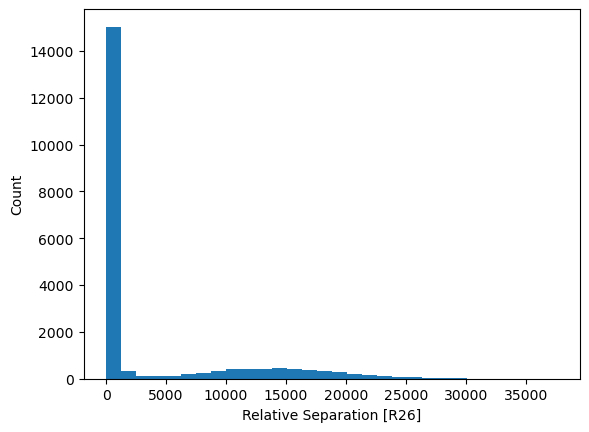

In [11]:
## plot a histogram of the separations
plt.figure()
plt.hist(sgagals['rel_sep'], bins=30)
plt.xlabel('Relative Separation [R26]')
plt.ylabel('Count')
# plt.yscale('log')
plt.show()

Obviously those with a relative separation over 1000 will be bad matches, so let's look at just the realistic matches (those with relative separation less than 1).

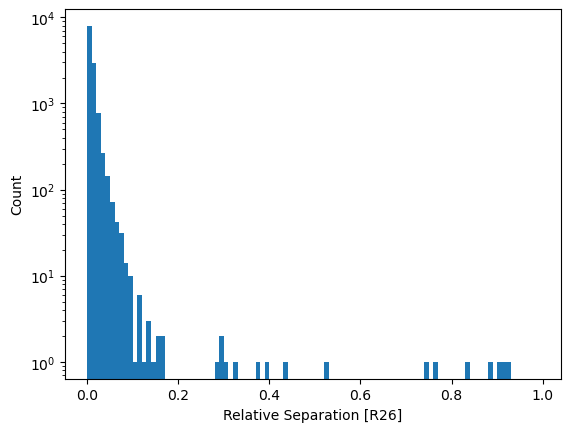

In [14]:
## plot a histogram of the separations to make sure this did what we wanted, and that everything is close
plt.figure()
plt.hist(sgagals['rel_sep'], bins=np.arange(0,1,0.01))
plt.xlabel('Relative Separation [R26]')
plt.ylabel('Count')
plt.yscale('log')
plt.show()

So, we do see a high number of objects that are likely to be good matches. We will do some VI to determine where we should make this cut.

## VI where the matches fall on the sky (to see if the footprints overlap well)

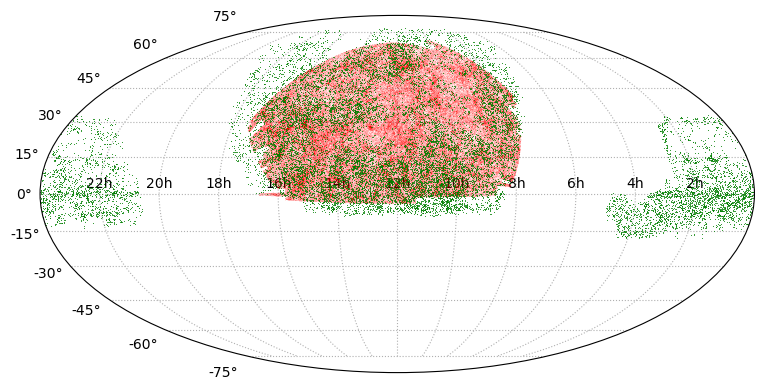

In [17]:
#Get the location of all Tempel catalog galaxies
catalog_coords = SkyCoord(ra=catalog['RAJ2000'], 
                          dec=catalog['DEJ2000'], 
                          unit=u.degree)
gal_coords = SkyCoord(ra=sgagals['RA'], 
                            dec=sgagals['DEC'], 
                            unit=u.degree)

fig, ax = plt.subplots(figsize=(10,4), tight_layout=True, subplot_kw={'projection' : 'mollweide'})

ra_catalog = np.radians(180*u.deg - catalog_coords.ra)
dec_catalog = np.radians(catalog_coords.dec)
ax.plot(ra_catalog, dec_catalog, '.', color='red', ms=0.1, mew=0.1)

ra_gal = np.radians(180*u.deg - gal_coords.ra)
dec_gal = np.radians(gal_coords.dec)
ax.plot(ra_gal, dec_gal, '.', color='green', ms=0.5, mew=0.5)

ax.set(xticklabels=[f'{_}h' for _ in np.arange(2,24, 2)][::-1])
ax.grid(ls=':');


So, this is why we see some extremely large separations, because those are objects in our sample that are on the regions not mapped by the Tempel catalog.

## Let's VI the objects to see how the separations behave

In [18]:
#### Function to actually pull image cutouts from legacysurvey to view the galaxies
def get_cutout(sgaid, ra, dec, size, verbose=False):
    """Grab and cache legacy survey cutouts.
    
    Parameters
    ----------
    sgaid : int
        SGA galaxy ID.
    ra : float
        Right ascension (degrees).
    dec : float
        Declination (degrees).
    verbose : bool
        Add some status messages if true.
        
    Returns
    -------
    img_name : str
        Name of JPG cutout file written after query.
    w : astropy.wcs.WCS
        World coordinate system for the image.
    """
    # Either load an existing image or download a cutout.
    img_name = 'cache/sga_{}.jpg'.format(sgaid)
    
    if os.path.exists(img_name):
        if verbose:
            print('{} exists.'.format(img_name))
    else:
        img_url = 'https://www.legacysurvey.org/viewer/cutout.jpg?ra={}&dec={}&zoom=14&layer=ls-dr9&size={}&sga'.format(ra, dec, size)
        if verbose:
            print('Get {}'.format(img_url))
            
        with open(img_name, 'wb') as handle: 
            response = requests.get(img_url, stream=True) 
            if not response.ok: 
                print(response) 
            for block in response.iter_content(1024): 
                if not block: 
                    break 
                handle.write(block)
                
    # Set up the WCS.
    wcs_input_dict = {
        'CTYPE1': 'RA---TAN',
        'CUNIT1': 'deg',
        'CDELT1': -0.262/3600,
        'CRPIX1': size/2 + 0.5,
        'CRVAL1': ra,
        'NAXIS1': size,
        'CTYPE2': 'DEC--TAN',
        'CUNIT2': 'deg',
        'CDELT2': 0.262/3600,
        'CRPIX2': size/2 + 0.5,
        'CRVAL2': dec,
        'NAXIS2': size
    }
    w = WCS(wcs_input_dict)
    
    return img_name, w

In [19]:
### function to generate the image with the sga and catalog center circles on them
def get_images(obj):
    # Retrieve SGA ID of galaxy
    sga_id = obj['SGA_ID']
    # print(sga_id)
    
    # Coordinates of SGA galaxy's center   
    center = (obj['RA_CAT'],obj['DEC_CAT'])
    # string_center = center.to_string(decimal = True) 
    # center_coords = string_center.split()
    ra, dec = float(obj['RA']), float(obj['DEC'])
    # print(ra, dec)
    
    # D26 in arcmin
    d26  = obj['D26']
    # print(d26)
    
    #---------------------------------------------------------------------------
    # Padd the image cutout of the galaxy.
    # Multiply by 60 (to arcsec), divide by 180 to get pixscale.
    npix = np.minimum(int(1.025 * d26*60/0.262), 512)
    
    #print(targetid, sga_id, ra, dec)
    img_file, wcs = get_cutout(sga_id, ra, dec, size=npix, verbose=False)
    img = mpl.image.imread(img_file)

    fig1 = plt.figure(figsize=(7,5))
    
    ax = fig1.add_subplot(1, 1, 1, projection=wcs)
    ax.imshow(np.flip(img, axis=0))
    ax.plot(ra, dec, color = "red", markersize = 30)
    ax.set(xlabel='ra', ylabel='dec')
    overlay = ax.get_coords_overlay('icrs')
    overlay.grid(color='white', ls='dotted')

    r1 = SphericalCircle((center[0] * u.deg, center[1] * u.deg), 0.05*d26*60*u.arcsec, edgecolor='orange', linewidth=1, facecolor='none', transform=ax.get_transform('icrs'))
    r2 = SphericalCircle((ra * u.deg, dec * u.deg), 0.05*d26*60*u.arcsec, edgecolor='red', linewidth=1, facecolor='none', transform=ax.get_transform('icrs'))
    ax.add_patch(r1)
    ax.add_patch(r2)
    
    fig1.subplots_adjust(top=0.85, right=0.85, bottom=0.15, left=0.15)
    
    fig1.savefig('cache/jura_tempel_VI/sga_{}.png'.format(sga_id), dpi=120)
    
    fig1.clear()
    plt.close(fig1)

In [20]:
#### function to display the desired cutouts
def show_cutouts(sga_ids, img_dir='cache/jura_tempel_VI', n_cols=5):

    image_files = [f'sga_{sga_id}.png' for sga_id in sga_ids]
    existing_files = [f for f in image_files if os.path.exists(os.path.join(img_dir, f))]

    if not existing_files:
        print("No matching image files found.")
        return

    n_images = len(existing_files)
    n_rows = math.ceil(n_images / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
    axes = axes.flatten()

    for i, img_file in enumerate(existing_files):
        img_path = os.path.join(img_dir, img_file)
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        axes[i].set_title(img_file.replace('.png', ''), fontsize=10)
        axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


First, let's try the objects with separations above 0.1 and see if any of these seem like a reasonable match.

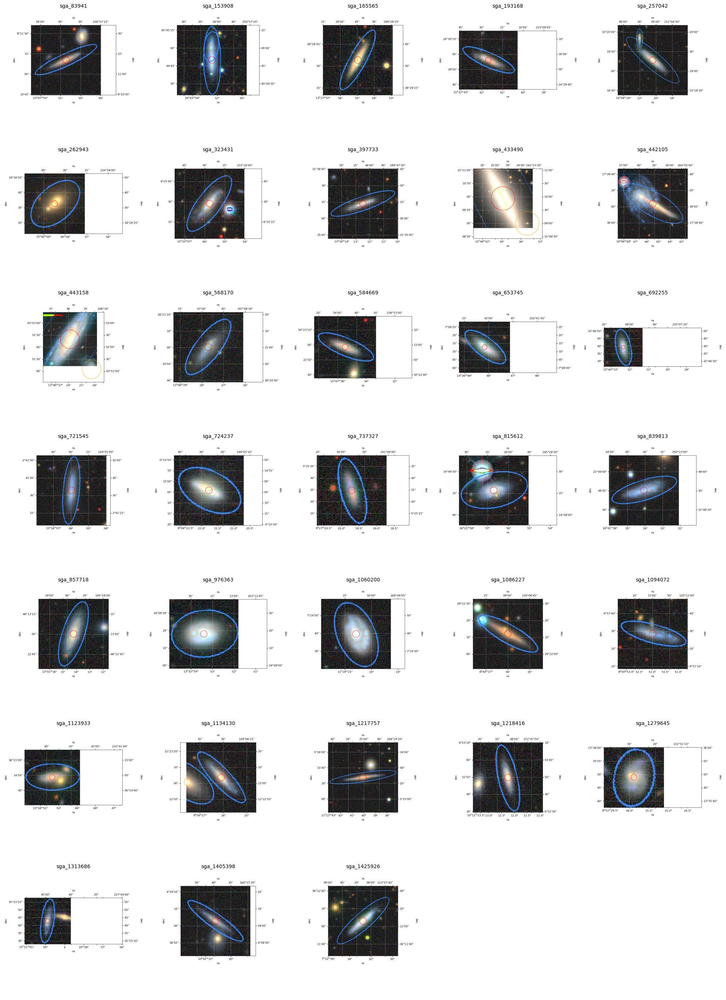

In [28]:
### Generate these figures, and show the objects within the desired separation interval 
test_match = sgagals[(sgagals['rel_sep'] > 0.1) & (sgagals['rel_sep'] < 1)]

for i in range(0,len(test_match)): 
    get_images(test_match[i])

### then 
show_cutouts(test_match['SGA_ID'])

Only 3 of the objects above 0.2 are good matches, and there are numerous bad matches within the same separation intervals, so we should only consider matches less than 0.2. Of the objects that are between 0.1 and 0.2, many appear to be due to coincident objects. So, we should exclude all of the matches with separations greater than $0.1R_{26}$. Now, let's verify if the objects with smaller separations are well behaved.

168


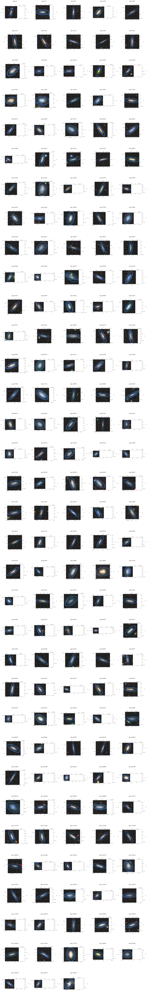

In [29]:
### Generate these figures, and show the objects within the desired separation interval 
near_matches = sgagals[(sgagals['rel_sep'] > 0.05) & (sgagals['rel_sep'] <= 0.1)]
print(len(near_matches))
for i in range(0,len(near_matches)): 
    get_images(near_matches[i])

### then 
show_cutouts(near_matches['SGA_ID'])

### All of these look good (except one random merger which we will throw out anyway), so it is reasonable to use 0.1 as the maximum allowed separation.

In [30]:
close_matches = sgagals[sgagals['rel_sep'] <= 0.1]
close_matches.write('Jura_Tempel_Coordinate_Matches.fits')